# Imports and Setup

In [2]:
!pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=0e1b39ab5535ed20d06d032e279aa3d272716decf79d343ce37cc0cd45c4f7d2
  Stored in directory: /root/.cache/pip/wheels/40/b3/0f/a40dbd1c6861731779f62cc4babcb234387e11d697df70ee97
Successfully built wget


In [3]:
import wget
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import warnings
warnings.filterwarnings("ignore")

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


# Downloading and Extracting Dataset

We will use torchvision and torch.utils.data packages for loading the
data.

The problem we're going to solve today is to train a model to classify
**ants** and **bees**. We have about 120 training images each for ants and bees.
There are 75 validation images for each class. Usually, this is a very
small dataset to generalize upon, if trained from scratch. Since we
are using transfer learning, we should be able to generalize reasonably
well.

This dataset is a very small subset of imagenet.
Most of the sites don't have certification: `--no-check-certificate`

The date also available for manual download from
   `https://download.pytorch.org/tutorial/hymenoptera_data.zip`
   and extract it to the current directory.




In [4]:
!wget https://download.pytorch.org/tutorial/hymenoptera_data.zip --no-check-certificate
!wget https://www.kaggle.com/datasets/ajayrana/hymenoptera-data/download?datasetVersionNumber=1 --no-check-certificate
!unzip hymenoptera_data.zip -d data

--2025-03-17 22:32:08--  https://download.pytorch.org/tutorial/hymenoptera_data.zip
Resolving download.pytorch.org (download.pytorch.org)... 3.165.102.113, 3.165.102.62, 3.165.102.36, ...
Connecting to download.pytorch.org (download.pytorch.org)|3.165.102.113|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47286322 (45M) [application/zip]
Saving to: ‘hymenoptera_data.zip’

hymenoptera_data.zi 100%[===================>]  45.10M   289MB/s    in 0.2s    

2025-03-17 22:32:08 (289 MB/s) - ‘hymenoptera_data.zip’ saved [47286322/47286322]

--2025-03-17 22:32:08--  https://www.kaggle.com/datasets/ajayrana/hymenoptera-data/download?datasetVersionNumber=1
Resolving www.kaggle.com (www.kaggle.com)... 35.244.233.98
Connecting to www.kaggle.com (www.kaggle.com)|35.244.233.98|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /account/login?titleType=dataset-downloads&showDatasetDownloadSkip=False&messageId=datasetsWelcome&returnUrl=%2Fdatasets%

## Data augmentation
- Augmentation and normalization for training - https://pytorch.org/vision/stable/transforms.html and https://pytorch.org/vision/main/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py
- Normalization for validation

In [5]:
print(torchvision.__version__)

0.21.0+cu124


# Data Preprocessing and Transformations

In [6]:
Batch_size=32;

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomAffine(degrees=(5, 50), translate=(0.1, 0.3), scale=(0.9, 1.1)),
        transforms.RandomPerspective(distortion_scale=0.2),
        transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = 'data/hymenoptera_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=Batch_size, shuffle=True, num_workers=4) for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

# Data Loading and Visualization


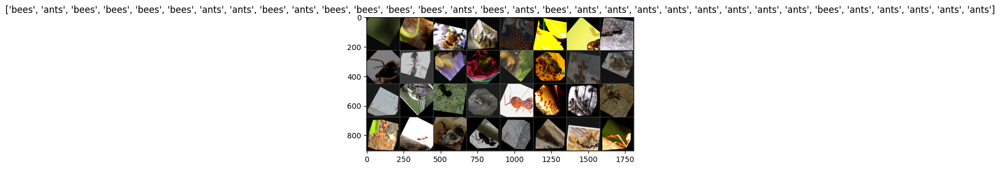

In [7]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

# Training the Model

In [8]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    val_acc_h=[]
    train_acc_h=[]
    for epoch in range(num_epochs):


        print('Epoch {}/{} LR {:.6f}'.format(epoch, num_epochs - 1, scheduler.get_last_lr()[0]))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()


                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
            if phase == 'train':
                train_acc_h.append(epoch_acc)
            # deep copy the model
            if phase == 'val':
                val_acc_h.append(epoch_acc)
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_h, train_acc_h

# Visualization

In [9]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                fig = plt.figure(figsize=(10,10))
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

# Model overview: **ResNet18**

**ResNet18 Architecture**

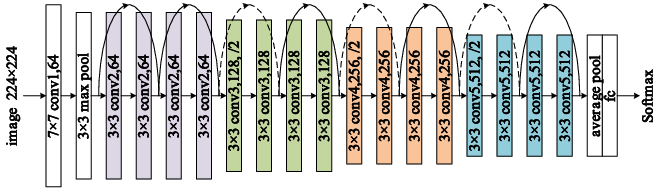

In [10]:
model = models.resnet18()
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

# Train the ConvNet from scratch

Everything from scratch - convolutional and fully connected

In [11]:
model = models.resnet18()
numrs = model.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model.fc = nn.Linear(numrs, 2)

model = model.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [12]:
model, val_acc_h, train_acc_h = train_model(model, criterion, optimizer, exp_lr_scheduler,
                       num_epochs=25)

Epoch 0/24 LR 0.000100
----------
train Loss: 0.8443 Acc: 0.5205
val Loss: 0.6806 Acc: 0.5621

Epoch 1/24 LR 0.000100
----------
train Loss: 0.6915 Acc: 0.5656
val Loss: 0.6657 Acc: 0.5621

Epoch 2/24 LR 0.000100
----------
train Loss: 0.7037 Acc: 0.5451
val Loss: 0.6627 Acc: 0.5425

Epoch 3/24 LR 0.000100
----------
train Loss: 0.6635 Acc: 0.6189
val Loss: 0.6412 Acc: 0.6536

Epoch 4/24 LR 0.000100
----------
train Loss: 0.6721 Acc: 0.6270
val Loss: 0.6045 Acc: 0.6797

Epoch 5/24 LR 0.000100
----------
train Loss: 0.6787 Acc: 0.5943
val Loss: 0.6705 Acc: 0.5425

Epoch 6/24 LR 0.000100
----------
train Loss: 0.6207 Acc: 0.6680
val Loss: 0.7014 Acc: 0.6078

Epoch 7/24 LR 0.000010
----------
train Loss: 0.6436 Acc: 0.6352
val Loss: 0.6102 Acc: 0.6471

Epoch 8/24 LR 0.000010
----------
train Loss: 0.6451 Acc: 0.6189
val Loss: 0.5899 Acc: 0.6993

Epoch 9/24 LR 0.000010
----------
train Loss: 0.6435 Acc: 0.6148
val Loss: 0.6115 Acc: 0.6536

Epoch 10/24 LR 0.000010
----------
train Loss: 0.6

[Text(0.5, 0, 'Iteration'), Text(0, 0.5, 'Train acc')]

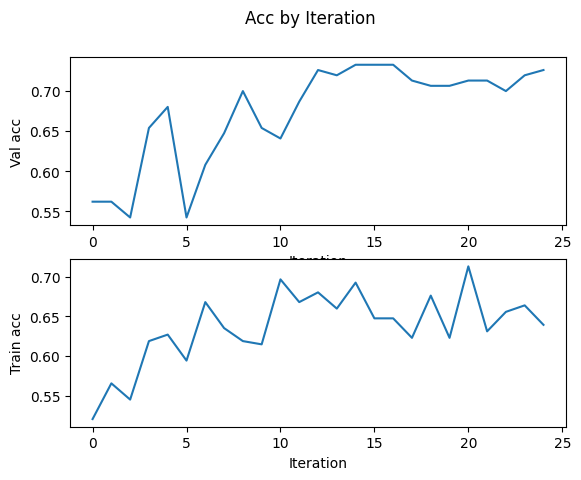

In [13]:
fig, splotH = plt.subplots(2)
fig.suptitle('Acc by Iteration')
splotH[0].plot(torch.tensor(val_acc_h, device = 'cpu'))
splotH[1].plot(torch.tensor(train_acc_h, device = 'cpu'))
splotH[0].set(xlabel='Iteration', ylabel='Val acc')
splotH[1].set(xlabel='Iteration', ylabel='Train acc')

# Finetuning the ConvNet




Load a pretrained model and reset final fully connected layer.
we're training the whole network again WITH pretrained weights - Convolution and Fully Connected

In [14]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, 2)

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss() # BinaryCrossEntropyLoss

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 126MB/s]


Train and evaluate

It should take around 15-25 min on CPU. On GPU though, it takes less than a
minute.




In [15]:
model_ft, val_acc_h, train_acc_h = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=5)

Epoch 0/4 LR 0.001000
----------
train Loss: 0.7844 Acc: 0.4549
val Loss: 0.7591 Acc: 0.5621

Epoch 1/4 LR 0.001000
----------
train Loss: 0.5905 Acc: 0.6967
val Loss: 0.4797 Acc: 0.8039

Epoch 2/4 LR 0.001000
----------
train Loss: 0.4450 Acc: 0.8074
val Loss: 0.3494 Acc: 0.8497

Epoch 3/4 LR 0.001000
----------
train Loss: 0.3717 Acc: 0.8770
val Loss: 0.2799 Acc: 0.9216

Epoch 4/4 LR 0.001000
----------
train Loss: 0.3718 Acc: 0.8320
val Loss: 0.2710 Acc: 0.9020

Training complete in 0m 19s
Best val Acc: 0.921569


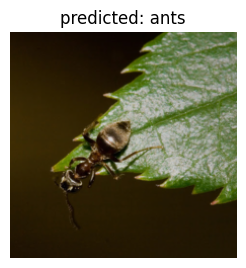

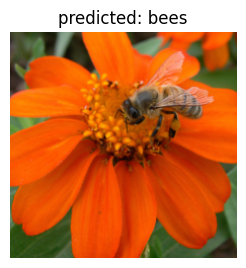

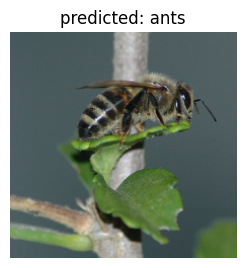

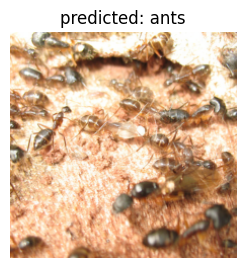

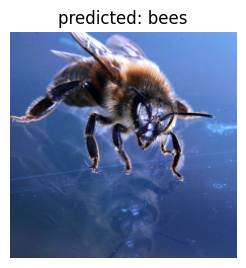

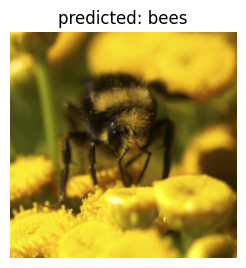

In [16]:
visualize_model(model_ft)

[Text(0.5, 0, 'Iteration'), Text(0, 0.5, 'Train acc')]

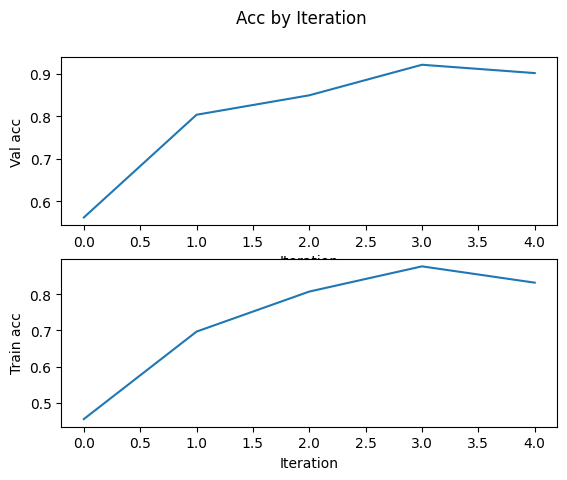

In [17]:
fig, splotH = plt.subplots(2)
fig.suptitle('Acc by Iteration')
splotH[0].plot(torch.tensor(val_acc_h, device = 'cpu'))
splotH[1].plot(torch.tensor(train_acc_h, device = 'cpu'))
splotH[0].set(xlabel='Iteration', ylabel='Val acc')
splotH[1].set(xlabel='Iteration', ylabel='Train acc')

# ConvNet as fixed feature extractor - Transfer Learning!






Here, we need to freeze all the network except the final layer. We need
to set ``requires_grad == False`` to freeze the parameters so that the
gradients are not computed in ``backward()``.

You can read more about this in the documentation
`here <https://pytorch.org/docs/notes/autograd.html#excluding-subgraphs-from-backward>`__.

In [18]:
model_conv = torchvision.models.resnet18(pretrained=True) ## PRETRAINED!!!
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

### Train and evaluate

On CPU this will take about half the time compared to previous scenario.
This is expected as gradients don't need to be computed for most of the
network. However, forward does need to be computed.




In [19]:
model_conv, val_acc_h, train_acc_h = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=25)

Epoch 0/24 LR 0.001000
----------
train Loss: 0.7719 Acc: 0.4877
val Loss: 0.5756 Acc: 0.6993

Epoch 1/24 LR 0.001000
----------
train Loss: 0.6378 Acc: 0.6352
val Loss: 0.4774 Acc: 0.7843

Epoch 2/24 LR 0.001000
----------
train Loss: 0.5316 Acc: 0.7418
val Loss: 0.3881 Acc: 0.8627

Epoch 3/24 LR 0.001000
----------
train Loss: 0.4645 Acc: 0.7828
val Loss: 0.3426 Acc: 0.8889

Epoch 4/24 LR 0.001000
----------
train Loss: 0.4135 Acc: 0.8197
val Loss: 0.3049 Acc: 0.8889

Epoch 5/24 LR 0.001000
----------
train Loss: 0.3919 Acc: 0.7992
val Loss: 0.2835 Acc: 0.8954

Epoch 6/24 LR 0.001000
----------
train Loss: 0.3744 Acc: 0.8566
val Loss: 0.2666 Acc: 0.9150

Epoch 7/24 LR 0.000100
----------
train Loss: 0.3371 Acc: 0.8893
val Loss: 0.2664 Acc: 0.9216

Epoch 8/24 LR 0.000100
----------
train Loss: 0.3497 Acc: 0.8648
val Loss: 0.2632 Acc: 0.9281

Epoch 9/24 LR 0.000100
----------
train Loss: 0.3442 Acc: 0.8402
val Loss: 0.2625 Acc: 0.9281

Epoch 10/24 LR 0.000100
----------
train Loss: 0.3

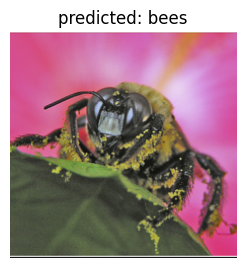

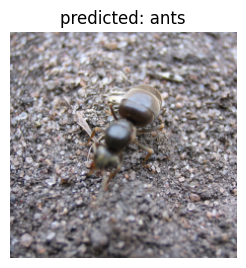

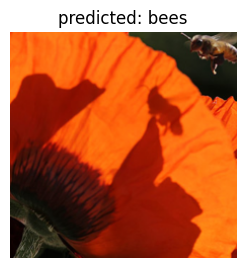

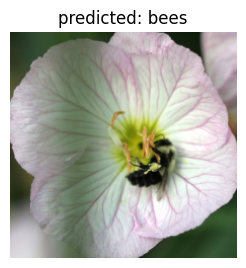

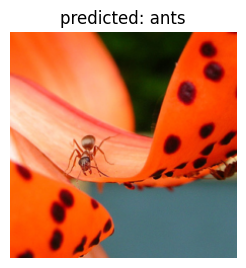

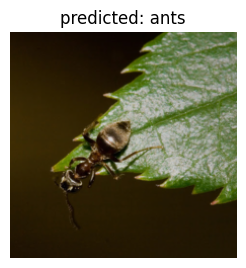

In [20]:
visualize_model(model_conv)

plt.ioff()
plt.show()

In [21]:
fig, splotH = plt.subplots(2)
fig.suptitle('Acc by Iteration')
splotH[0].plot(torch.tensor(val_acc_h, device = 'cpu'))
splotH[1].plot(torch.tensor(train_acc_h, device = 'cpu'))
splotH[0].set(xlabel='Iteration', ylabel='Val acc')
splotH[1].set(xlabel='Iteration', ylabel='Train acc')

[Text(0.5, 0, 'Iteration'), Text(0, 0.5, 'Train acc')]

# Then finetuning the entire network


In [22]:
#model_conv = torchvision.models.resnet18(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = True


# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv_2 = optim.SGD(model_conv.fc.parameters(), lr=0.00001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler_2 = lr_scheduler.StepLR(optimizer_conv_2, step_size=7, gamma=0.1)

In [23]:
model_conv, val_acc_h, train_acc_h = train_model(model_conv, criterion, optimizer_conv_2,
                         exp_lr_scheduler_2, num_epochs=20)

Epoch 0/19 LR 0.000010
----------
train Loss: 0.3257 Acc: 0.9016
val Loss: 0.2596 Acc: 0.9346

Epoch 1/19 LR 0.000010
----------
train Loss: 0.3464 Acc: 0.8648
val Loss: 0.2611 Acc: 0.9281

Epoch 2/19 LR 0.000010
----------
train Loss: 0.3589 Acc: 0.8770
val Loss: 0.2619 Acc: 0.9150

Epoch 3/19 LR 0.000010
----------
train Loss: 0.3585 Acc: 0.8238
val Loss: 0.2595 Acc: 0.9281

Epoch 4/19 LR 0.000010
----------
train Loss: 0.4035 Acc: 0.8115
val Loss: 0.2568 Acc: 0.9281

Epoch 5/19 LR 0.000010
----------
train Loss: 0.3410 Acc: 0.8730
val Loss: 0.2595 Acc: 0.9216

Epoch 6/19 LR 0.000010
----------
train Loss: 0.3288 Acc: 0.8811
val Loss: 0.2569 Acc: 0.9281

Epoch 7/19 LR 0.000001
----------
train Loss: 0.3515 Acc: 0.8770
val Loss: 0.2589 Acc: 0.9216

Epoch 8/19 LR 0.000001
----------
train Loss: 0.3646 Acc: 0.8443
val Loss: 0.2547 Acc: 0.9346

Epoch 9/19 LR 0.000001
----------
train Loss: 0.3735 Acc: 0.8566
val Loss: 0.2569 Acc: 0.9281

Epoch 10/19 LR 0.000001
----------
train Loss: 0.3

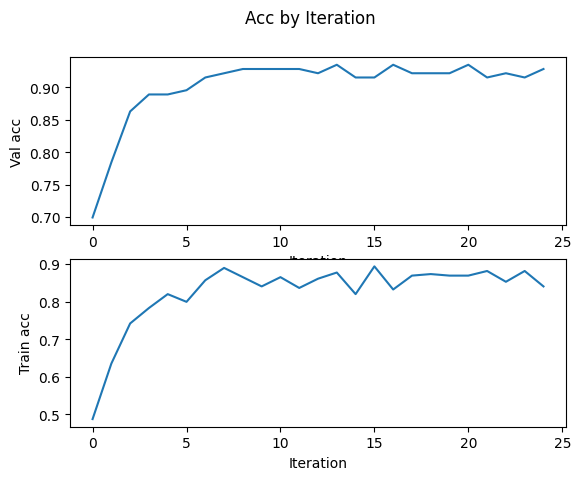

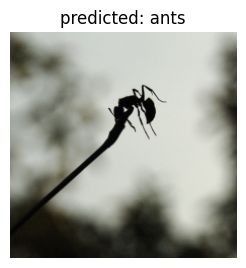

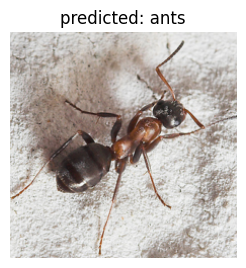

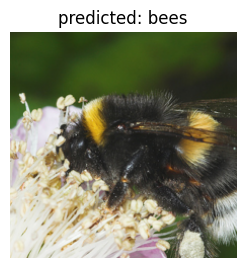

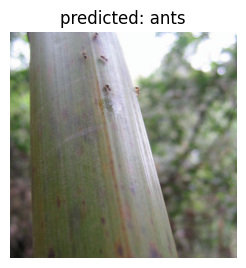

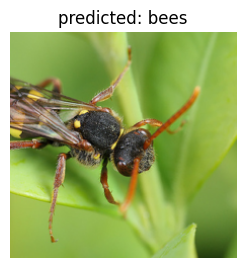

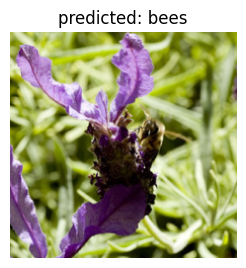

In [24]:
visualize_model(model_conv)

plt.ioff()
plt.show()

In [25]:
from torch.utils.tensorboard import SummaryWriter

# default `log_dir` is "runs" - we'll be more specific here
writer = SummaryWriter('runs/lab_5')

In [29]:
# get some random training images
dataiter = iter(dataloaders['train'])
images, labels = next(dataiter)

# create grid of images
img_grid = torchvision.utils.make_grid(images)

# write to tensorboard
writer.add_image('lab_5_images', img_grid)

In [27]:
%load_ext tensorboard
#%reload_ext tensorboard
%tensorboard --logdir="runs"
#  http://localhost:6006

<IPython.core.display.Javascript object>

In [28]:
writer.add_graph(model_ft.to('cpu'), images)
writer.close()